# Mask Detection


<center>
  <img src=https://drive.google.com/uc?export=view&id=19TcTNVctD3HHk4mph-pm55TQk867GIIg width="1000"/>
</center>


Check out the image above. These are predictions of a Convolutional Neural Network that predicts faces wearing masks and segments the face-mask area. Do you want to know how this is done? This Jupyter Notebook contains a tutorial for Face Mask detection in people, using a custom Convolutional Neural Network. The network, dataset class, utility functions and train/test scripts are written from scratch in PyTorch and explained in detail. If you have dabbled in Computer Vision/ML/DL or just interested in such things, this is for you. 

## Objective
The objective of the project is to train a object detection network that detects people wearing or not wearing a mask. Alos, it is desired that a segmentation of the mask be extracted from faces wearing the mask. The extraction of face-mask segmentations are firstly, performed using traditional OpenCV techniques and later with our custom CNN. 

## Sections

To address the above mentioned objectives, this notebook is divided into 3 sections primarily:


1.   Object detection of mask/no-mask faces using custom CNN
2.   Segmenting face-mask using OpenCV
3.   Segmenting face-mask using our Custom CNN
 
Lets dig into each of these sections


##**1. Object detection of mask/no-mask faces using custom CNN**
### Options explored

Compared to simple classification, designing a  multi object detection network using a custom CNN is tricky. This is because a classifier just has to predict a single label for each image. In multi object detection the network has to output both class labels and xy co-ordinates for each object found, and number of objects can vary depending on the image. However a network needs to have a constant output dimension irrespective of the number of predictions.This means that there needs to be some method of discretization of the problem that accounts for the variying number of bboxes. These are the availale methods in literature.

#####**1.   Sliding window approach with image pyramids**:
This is a rudimentary way performing object detection without actually doing object detection. Lets take our case of mask/no-mask detection. The idea is to train a CNN offline that classifies patches of images as belonging to one of the 3 classes—backround, mask and no-mask. These image patches are extracted from the training data using the available ground truths. An additional class background is created and a fixed number of patches that do not correspond to the other classes of interest are picked at random from each image. 

  During testing, we slide a window across the image and use the trained classifier to determine if the window contains an object of interest. If the window contains an object, we record its location and scale in the image.We then move to the next level of the pyramid and repeat the sliding window approach. The scale of the window is adjusted at each level to match the resolution of the image.

  By using the image pyramid, we can detect objects at different scales, which is useful when the size of the objects in the image is unknown. Additionally, the sliding window approach allows us to detect multiple objects in an image, as we can slide the window across the image multiple times to detect different objects. A Non Maximun Suppresion technique is applied on the predicted bounding boxes to retain only the most confident predictions and prevent overlapping. The flow chart below shows the process.
  
   









<center>
<img src=https://drive.google.com/uc?export=view&id=19MV4I3nknDZWsQv_5lFXurReAzvbkPSD width="500">
<img src=https://drive.google.com/uc?export=view&id=19O2_0H_Vwx-MlGxNbhvh-2CWxLyucWbY width="500">
</center>

<center>
  <img src=https://drive.google.com/uc?export=view&id=19OSu6fsXME4RgNWnzyAWOpsJwlfRFcoj width="800"/>
</center>



This approach was tried for our case and an example prediction is shown above. The model performs poorly and is unable to pick faces consistently. In an attempt to improve the classifier more backgorund images were sampled and trained. This creates a class imbalance problem between background and foreground and further corrupts the model. Morover although this method works for small images, scaling this would be a problem as the sliding window involves a huge number of computations(window slid with small strides). Therefore progressing along this technique seems like a bad idea.



**2. Two stage detectors:**

Another option is to use "two-stage" object detection as they are called. Examples are the RCNN family which includes Mask-RCNN, Fast-RCNN, Faster-RCNN, FPN and the likes. The architecture consists of two stages: a region proposal network (RPN) followed by a classifier network. In the first stage, the RPN generates a set of potential object regions (bounding boxes) in an image. The RPN takes an image as input and outputs a set of proposed regions, each with an associated objectness score. The objectness score is a measure of how likely a region contains an object of interest. In the second stage, the classifier network takes the proposed regions generated by the RPN and classifies them into different object categories. The classifier network uses features extracted from the proposed regions by a shared CNN to classify the objects. Finally, the predicted bounding boxes are refined to more accurately localize the objects. Athough these networks are quite accurate at prediction, they are computation heavy as they involve multiple stages.

**3. Single stage detectors:**

Single-stage detectors, such as YOLO, handle varying numbers of bounding boxes per image by dividing the input image into a grid of cells and predicting a fixed number of bounding boxes for each cell.
Each cell in the grid is responsible for predicting the bounding boxes that fall within its boundaries. Each bounding box prediction includes the coordinates of the box, a confidence score that indicates the presence of an object, and class probabilities for each object category.During training, the model is trained to predict the bounding boxes for each grid cell that have the highest overlap with the ground truth bounding boxes. During inference, the model outputs a fixed number of bounding boxes for each cell, regardless of whether or not there is an object in that cell. These boxes are then filtered based on their confidence scores and their overlap with other boxes using non-maximum suppression to remove duplicates and retain the most likely object detections.This approach allows single-stage detectors to handle varying numbers of bounding boxes per image.However, it may not perform as well as two-stage detectors in scenarios where objects have complex shapes or occlusions that require more precise bounding boxes.



###Option chosen

We need to figure out how to deal with variying number of bboxes per image which needs some method of abstraction of the problem. 
Using region proposals or grids with anchor boxes is not the way to proceed as we have the constraint of not using complex architechtures that are already available in the literature for our task. Neither can we use pre-trained weights. That leaves us with option 1 which was tried and produced unfavourable results. 

  **An alternative is to approach this task as an image segmentation problem. The idea is to convert the bbox annotations to extra channels that contain the segmentation masks for each class. The network is trained for this image segmentation problem. During testing, the predictions are fed to an OpenCV pipeline that discretizes these segmentations into seperate bboxes. However, we can already predict that closely packed segmentations cannot be discretized into seperate instances. This is the limitation of this approach and we have to work with it**. Now enough talking, lets get down to buisness!

### **Initialize**

By now it is assumed you have downloaded/cloned the repository to you local machine. Navigate to the dowloaded folder and set the path as the working directory for this project. In my case, it is `/content/PEA` as the project was done on Google Colab Notebook.

In [2]:
import os
#!cp -r /content/drive/MyDrive/PEA /content 
%cd /content/PEA

cwd = os.getcwd()
os.chdir(cwd)
print(cwd)

/content/PEA
/content/PEA


Here we define some parameters for our project that will remain constant. `class_map` is a dictionary that maps class names to one-hot encoded vectors. `img_size` decides the size of the input image fed to the network. Feel free to change `img_size` and `batch_size` later on.

In [3]:
# Some constant parameters for our project
class_map = {"back":[1,0,0], "no-mask":[0,1,0], "mask":[0,0,1]}
img_size = (256,256)
batch_size  = 10

###**Dataset Class**

The code below defines the Dataset Class and the Data Loaders for train and vailidation sets. Refer to the Class `Face_Detection` in `dataloader/dataloader_main.py` for its implementation. Any PyTorch Dataset Class has three methods 1)`__init__` which initializes the paths to annotations and other parameters in argument, `__len__` which returns the size of dataset,3)`__getitem__` is most important which returns the ground truths in the required format. For every iteration,  `__getitem__` recieves the path `idx` and loades the corresponding image and annotations. The XML format is converted into [xmin, ymin, xmax, ymax] bboxes and one-hot encoded labels. Finally the annotations are converted into a format where each image is associated with target ground truth having dimension (image.height, image.width, 3). The first two dimensions are the same as the input image. The last dimension corresponds to the number of classes - background([1,0,0]), no-mask([1,0,0]) and mask([1,0,0]). The picture below illustrates this method.   

<center>
  <img src=https://drive.google.com/uc?export=view&id=19PMeweGAUVoejIschy5fCItYVYOTz5mU width="500"/>
</center>


In [4]:
from dataloader.dataloader_face import*
import torchvision.transforms as transforms

# Initialize Train, Validation Datasets  with parameters 
d_train_face = Face_Detection('data/train', class_map, img_size, transforms=False)
d_val_face = Face_Detection('data/valid', class_map, img_size)

# Load Train, Validation Dataloaders for Training
train_data_face = Data_Loader_Face(d_train_face, batch_size=batch_size, shuffle=True, num_workers=1)
val_data_face = Data_Loader_Face(d_val_face, batch_size=batch_size, shuffle=True, num_workers=1)

Lets see some examples from the training dataset. Each color corresponds to a seperate class(background class ignored). The function `explore_dataset()` is implemented in `utils/utils.py`

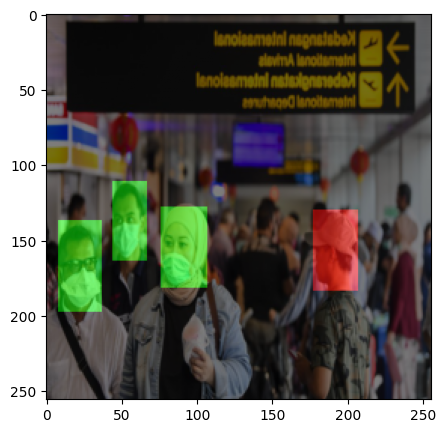

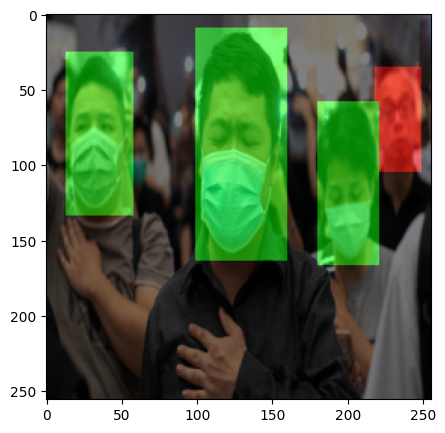

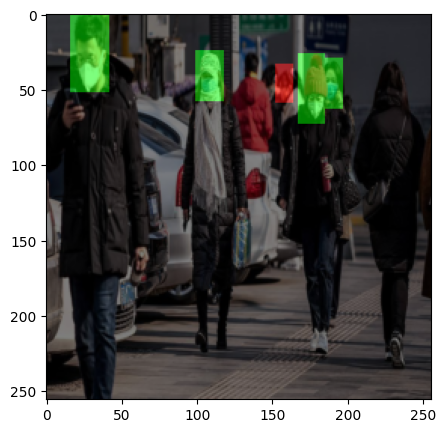

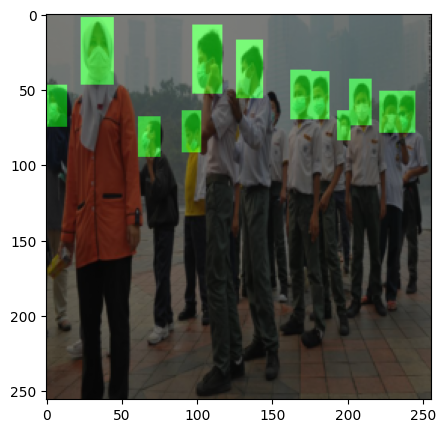

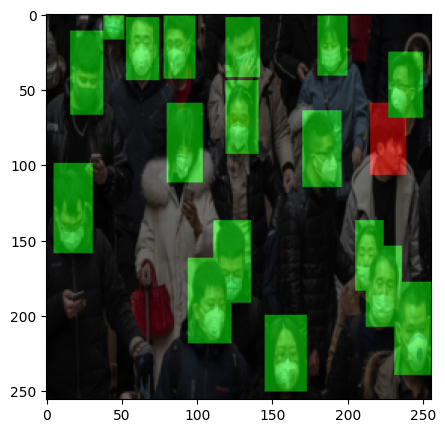

...

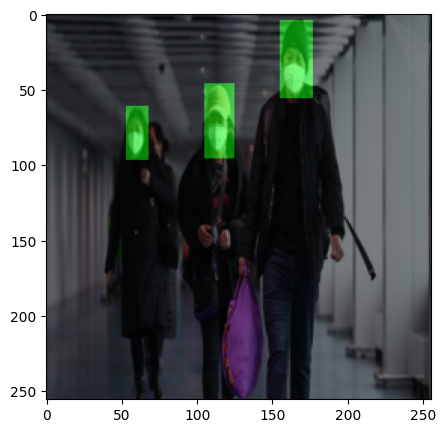

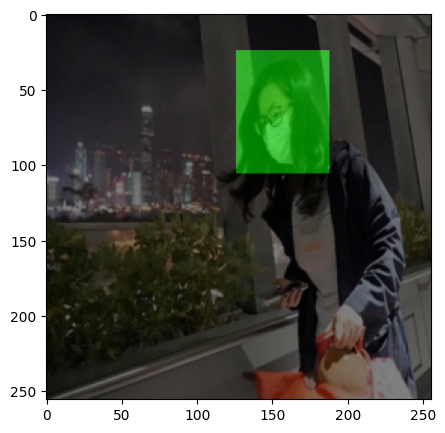

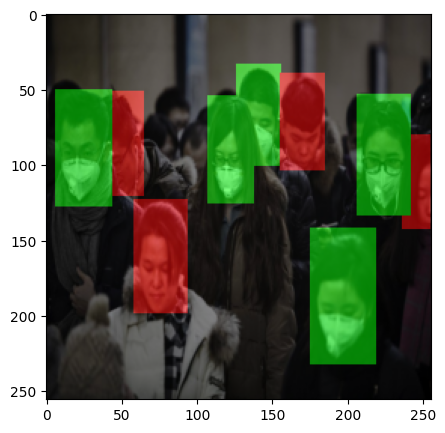

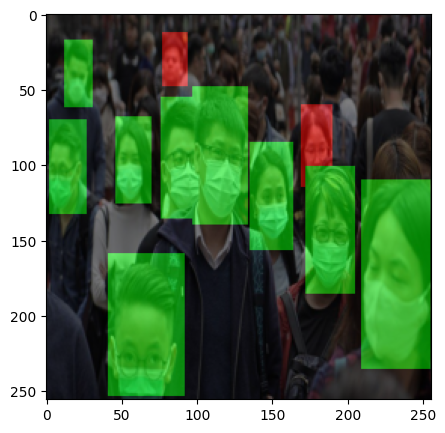

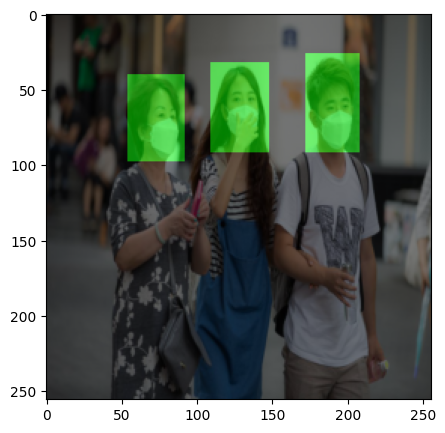

In [4]:
from utils.utils import *
explore_dataset(d_train_face, 10)

Now lets look at how many instances of each class are present in the dataset. Run the cell below which calls the function `count_class_occurance` present in `utils/utils.py` file. We can see that the number of "mask" faces greatly outweighs the "no-mask" faces. Therefore there is clearly a problem of class imbalance in our dataset. Lets proceed. 

In [19]:
count_class_occurance(d_train_face, class_map) 

Number of Images in dataset:  105
Number of instances of class "no-mask": 123
Number of instances of class "mask": 573
Number of instances of all classes: 696


### **Network Architecture**

 Next we define our custom CNN architecture. Have a look at the Class defined in python file `models/CNN_FACE.py`. It is pretty straightforward to understand. 
 
* First we perform a serious of convolution operations of the input image to extract features. The image size is gradually reduced while the number of channels is gradually increased for every new convolutional layer. This extracts both low-level and high-level features and stacks them one behind another. Downsampling is performed by pooling layers.
* Beacuse we are dealing with a segmentation approach to the task, we want some method of upsampling these features back the the input image dimension. Therefore we use Transposed Convolutions which restore the output to the required dimensions. 
* We also use batchnorm  training whih has advantages like speed, stability, and generalization performance. 
* We use ReLU activation between layers due to its superior capacity in handling sparsity(we mostly have zeros).
* As we are dealing with a small training dataset, we use dropout between some layers to prevent overfitting and help generalization.
* The last convolutional operation reduces the number of channels to the required number. In this case it is 3(background, no-mask, mask).   
* Finally a Sigmoid activation is applied in the last later which converts each pixel to a list of probablities belonging to a particular class. 

Run the the code cell below to initiaize the model and pass a sample image from the dataset through the network. The expected dimensions of the input, target and output are given below. Verify if they are correct.   

In [5]:
import torch
from models.CNN_FACE import*

# Create CNN model
model = CNN_FACE()

# Verify compatibility
images, targets = next(iter(train_data_face))
output = model(images)

print(f'Expected image shape:        (batchsize, 3, 256, 256)')
print(f'Input image shape:           {images.shape}')
print("----------------------------------------------------------")
print(f'Expected ground truth shape: (batchsize, 256, 256, 3)')
print(f'Input ground truth shape:    {targets["masks_faces"].shape}') 
print("----------------------------------------------------------")
print(f'Expected output shape:       (batchsize, 256, 256, 3)')
print(f'Output mask_faces shape:     {output.shape}')


Expected image shape:        (batchsize, 3, 256, 256)
Input image shape:           torch.Size([10, 3, 256, 256])
----------------------------------------------------------
Expected ground truth shape: (batchsize, 256, 256, 3)
Input ground truth shape:    torch.Size([10, 256, 256, 3])
----------------------------------------------------------
Expected output shape:       (batchsize, 256, 256, 3)
Output mask_faces shape:     torch.Size([10, 256, 256, 3])


###**Loss function**
Next we define the loss to be backpropogated through the network. As we are dealing with loss between two one-hot encoded vectors, we need a classification loss. Cross entropy loss is a commonly used loss function for muti-class classification/segmentation. However, we saw earlier that there is a problem of class imbalance in the dataset.

Therefore we use Focal Loss that adresses imbalanced classes. Focal loss is a modification to the standard cross-entropy loss function that is commonly used in object detection tasks, where the number of negative samples is much larger than the number of positive samples. The idea behind focal loss is to downweight the contribution of easy-to-classify examples (i.e., samples that are correctly classified with high confidence) and focus more on hard-to-classify examples (i.e., samples that are misclassified or have low confidence scores).  In the function, `pt` is the predicted probability of the true class label, `alpha` is a class-specific weighting factor that can be used to adjust the importance of different classes, and `gamma` is a focusing parameter that controls the degree of downweighting for easy examples.Refer to the [focal loss paper](https://arxiv.org/pdf/1708.02002.pd) for its implementation.    

In [21]:
import torch
import torch.nn.functional as F
import torch.optim as optim

def focal_loss(mask_pred, mask_truth, alpha, gamma):
  
    # reshape the tensors to (batchsize * height * width, num_classes)
    mask_pred = mask_pred.reshape(-1, mask_pred.shape[3])
    mask_truth = mask_truth.reshape(-1, mask_truth.shape[3])

    ce_loss = F.cross_entropy(mask_pred, mask_truth, reduction='none') 
    pt = torch.exp(-ce_loss)
    focal_loss = (alpha * (1-pt)**gamma * ce_loss).mean() # mean over the batch

    return focal_loss            

###**Optimizer**
We chose the Adam optimizer for its overall superiority with `lr=0.01`.

In [22]:
learning_rate = 0.01
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

###**Training**

Now we put all parts together and define the training loop. The script also includes a validation step for every epoch which saves the best performing model. For every epoch, train and val losses are saved to a csv file. For the training code please refer to `train.py` It is recommended that you use CUDA if available for faster completion. Otherwise you can still proceed with CPU. Feel free to change epochs and directory for saving trained weights if needed.

In [9]:
from train import*

epochs = 100
save_dir = "trained_weights/check_face.pt"
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

train(model, device, train_data_face, val_data_face, epochs, optimizer, focal_loss, save_dir)

Epoch 1/100, Train Loss: 0.1046, Val Loss: 0.1997
Epoch 2/100, Train Loss: 0.0917, Val Loss: 0.1156
Epoch 3/100, Train Loss: 0.0845, Val Loss: 0.1154
Epoch 4/100, Train Loss: 0.0774, Val Loss: 0.0848
Epoch 5/100, Train Loss: 0.0721, Val Loss: 0.0714
Epoch 6/100, Train Loss: 0.0677, Val Loss: 0.0704
Epoch 7/100, Train Loss: 0.0652, Val Loss: 0.0663
Epoch 8/100, Train Loss: 0.0638, Val Loss: 0.0725
Epoch 9/100, Train Loss: 0.0626, Val Loss: 0.0717
Epoch 10/100, Train Loss: 0.0603, Val Loss: 0.0895
Epoch 11/100, Train Loss: 0.0583, Val Loss: 0.0629
Epoch 12/100, Train Loss: 0.0588, Val Loss: 0.1036
Epoch 13/100, Train Loss: 0.0578, Val Loss: 0.0628
Epoch 14/100, Train Loss: 0.0571, Val Loss: 0.0634
Epoch 15/100, Train Loss: 0.0554, Val Loss: 0.0590
Epoch 16/100, Train Loss: 0.0560, Val Loss: 0.0591
Epoch 17/100, Train Loss: 0.0548, Val Loss: 0.0594
Epoch 18/100, Train Loss: 0.0537, Val Loss: 0.0640
Epoch 19/100, Train Loss: 0.0543, Val Loss: 0.0599
Epoch 20/100, Train Loss: 0.0530, Val Lo

Once training completes plot the Train-Val losses using the saved csv file. You can see that the validation loss decreases to a point of saturation after which it tends to increase again. Any further, the network overfits to the training data. We would want to save the model at this point. 

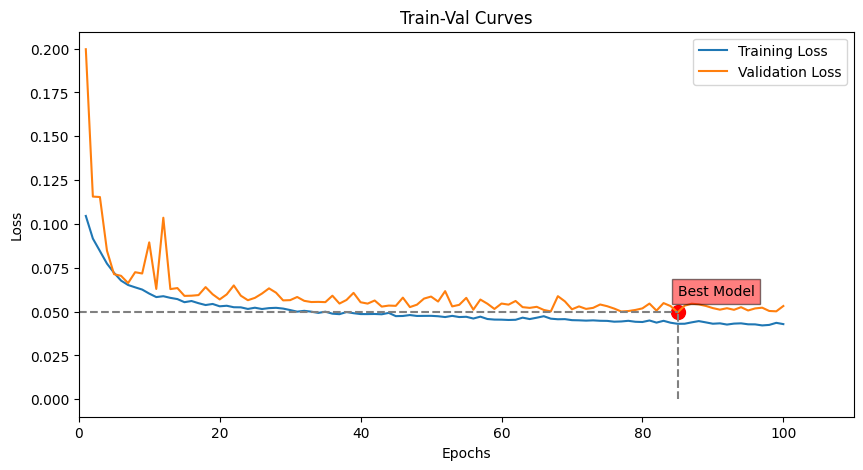

In [10]:
from utils.utils import*
save_dir = "trained_weights/check_face.pt"
df = pd.read_csv(save_dir[:-3] + ".csv") 
plot_train_val(df)

###**Testing**

During the testing phase, we first create the test dataloader, initialize the network again and chose the weights of the best performing model. Refer to the function `test.face` in `test_scripts.py`. 

Run the cell below. The dictonary `show` can be changed depending on what you would like to visualize. During testing, the model predicts segmentation masks for each class as the output. This is further processed using OpenCV techniques to obtain bbox coordinates of each instance of a class. To understand this, toggle `"face_seg":True` in `show` (if it is currently false) and run the cell again. Segmentations of class *mask* are highlighted. As expected segmentations that are joined together are identified as a single bbox which decreases the number of predicted bboxes. This is the inherent limitation of this approach. One can also note that the *no-mask* class is completely ignored and either classified as *mask* or not picked up at all. 

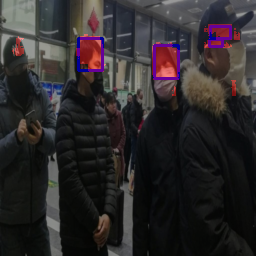

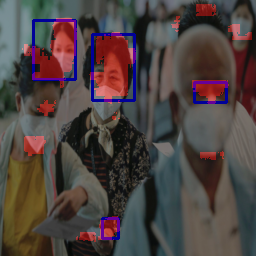

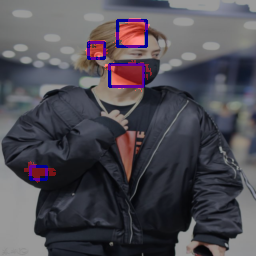

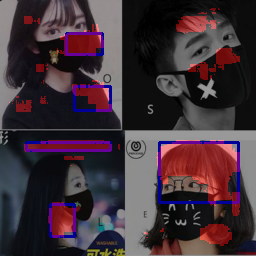

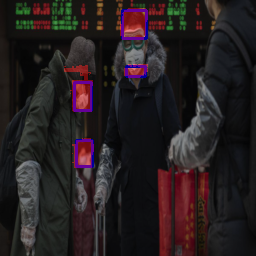

...

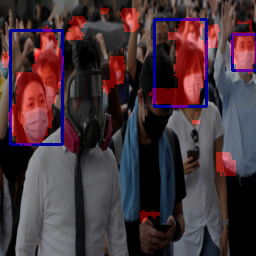

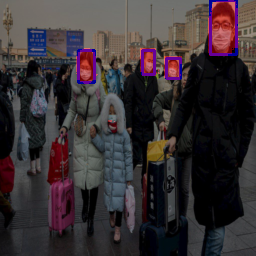

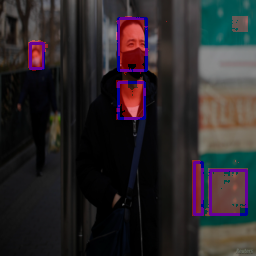

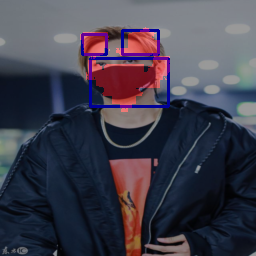

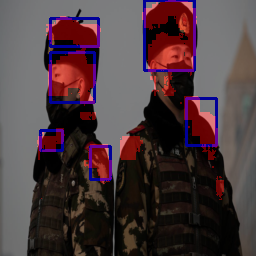

In [9]:
#from test_scripts.test_face import*

thresh = 0.1
d_test_face = Face_Detection('data/test', class_map, img_size, transforms = None, data_mine=False)
test_data_face = Data_Loader_Face(d_test_face, batch_size=1, shuffle=False, num_workers=1)

model = CNN_FACE()
best_model = "trained_weights/check_face.pt"
show = {"images": True, "bboxes":True, "face_seg":True, "mask_seg":False}

pred_boxs, true_boxs = test_face(model, test_data_face, best_model, thresh, show, inv_trans=False)


###**Evaluation**
Now lets look at some evaluation metrics. The most common evaluation metrics for object detection are Precision, Recall, F1 score and Mean Average Precision (mAP). The metrics are defined as:

\begin{equation}
Precision = \frac{TP}{TP+FP} \\
Recall = \frac{TP}{TP+FN} \\
F1 = \frac{2*Precision*Recall}{Precision+Recall} \\
AP =  \int_{0}^{Recall_{max}} PR curve \\
mAP =  \frac{1}{C}\sum_{c=1}^{C} AP_{c} 
\end{equation}

Here, TP and FP and FN refer to True Positives, False Positives and False Negatives respectively. These are decided by the Intersection Over Union (IOU) between predicted and GT bboxes. AP is defined as the area under the Precision vs Recall curve for a certain IOU threshold. mAP is an average of AP calculated for each class. 

Run the cell below for computing the metrics and plotting the PR curve. The implementation is provided in the `metrics.py` script. There is an additional curve added on top of the PR curve called the interpolated curve. This is obtained using the [101 point interpolation method](https://jonathan-hui.medium.com/map-mean-average-precision-for-object-detection-45c121a31173) performed to calculate the area under the PR curve. You can see that the model has performed relatively well for the *mask* class considering there are only 100 images for a sophisticated task like segmentation. However there are no predictions observed for the no-mask class and consequently all metrics show nil. 


Metrics @ IOU 0.5
-----------------------------
Class Mask
-----------------------------
Precision : 0.537
Recall    : 0.396
F1 Score  : 0.456
AP        : 0.31
-----------------------------
Class No-Mask
-----------------------------
Precision : 0
Recall    : 0
F1 Score  : 0
AP        : 0
-----------------------------
Overall
-----------------------------
Precision : 0.537
Recall    : 0.375
F1 Score  : 0.442
mAP       : 0.157
-----------------------------


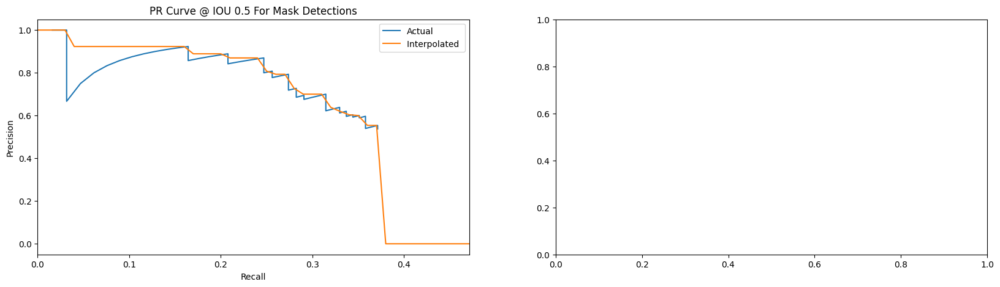

In [10]:
#from metrics import*
        
iou_thresh = 0.5
df_mask, df_nomask, gt_mask_sum, gt_nomask_sum = compute_positives(pred_boxs, true_boxs, iou_thresh)
pr_curve(df_mask, df_nomask, gt_mask_sum, gt_nomask_sum, iou_thresh)   

##**2. Segmenting Face Mask using OpenCV**

###**Visualize patches**
The task is to use extsing OpenCV techniques to extract just the mask portion from the `mask` image patches. If you have played around with thresholding/contouring/edge detection techniques, you will know that there is no one size fits all and it will need tinkering on a case by case basis. Most of these methods if directly applied create noise in the images which becomes difficult to clear selectively. You either end up losing the region of interest or inculde too much noise. Straight away what comes to mind is finding out what colour space the masks belong to and then filtering out only those colours. So let us first visualize the patches and the colorspace that they belong to. This can be done using OpenCV's HSV colorspace method. Run the code below for its implementation.  

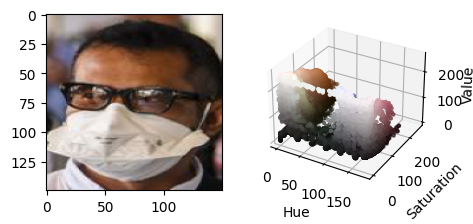

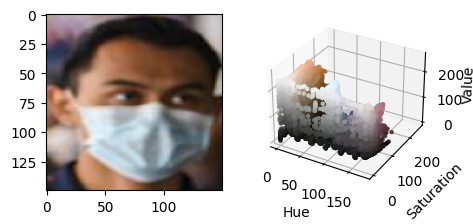

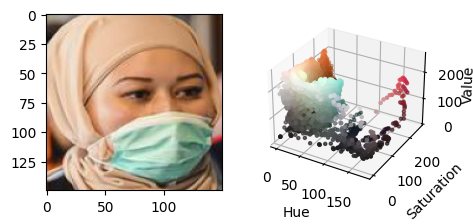

In [81]:

import cv2
import matplotlib.pyplot as plt
import numpy as np
from dataloader.dataloader_support import*

dataset = Objectdetection('data/train', class_map, img_size)

for i, (image, boxes, labels, img_id) in enumerate(dataset):
    gate = torch.where(labels[:,2]==1)
    labels = labels[gate]
    boxes = boxes[gate]
    boxes = boxes.numpy().astype(int)
    image = image.permute(1,2,0).numpy()
    image = (image*255).astype(np.uint8)

    for i, box in enumerate(boxes):
        xmin,ymin,xmax,ymax = box
        face = image[ymin:ymax, xmin:xmax,:]
        face_r = cv2.resize(face, (150,150), interpolation = cv2.INTER_AREA)
        fig = plt.figure(figsize=(5, 2.5))
        ax = fig.add_subplot(1, 2, 1)
        ax.imshow(face_r)

        hsv_face = cv2.cvtColor(face_r, cv2.COLOR_RGB2HSV)
        pixel_colors = list(face_r.reshape(-1, 3)/255)
        h, s, v = cv2.split(hsv_face)

        ax = fig.add_subplot(1, 2, 2, projection="3d")
        ax.scatter(h.flatten(), s.flatten(), v.flatten(), facecolors=pixel_colors, marker=".")
        ax.set_xlabel("Hue")
        ax.set_ylabel("Saturation")
        ax.set_zlabel("Value", rotation=90)
        ax.zaxis.labelpad=-0.7
    if i==2:
      break

###**Select color**
We can see that there the color of mask is not just bluw but can be white, grey, pink, black or any other colour. Therefore filtering only blue colour would not work. What if we can filter all other parts of the image except the mask? We already know few priors:


*   Masks are always at the bottom half of the image.
*   Faces are mostly centered inside the bbox.
*   Skin colour is always different shades/values of brown. 


Let us use these priors cleverly to simplify our problem. We can first remove the skin from the images by selecting the colourspace that the skin belongs to. This will create a clear silhouette for the face mask. Further processing can be done later on to filter out other parts wihout affecting the face mask region. From the graphs above let us first select the skin colorspace. A broad region is selected so that everything between light skin to dark skin is considered.   

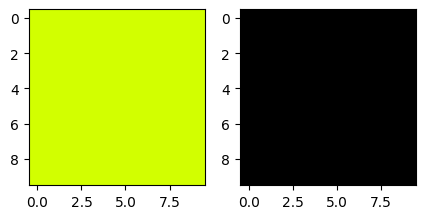

In [80]:
from matplotlib.colors import hsv_to_rgb

light_skin = (0, 50, 0)
dark_skin = (50, 255, 255)
lo_square = np.full((10, 10, 3), light_skin, dtype=np.uint8) / 255.0
do_square = np.full((10, 10, 3), dark_skin, dtype=np.uint8) / 255.0

fig, axs = plt.subplots(1,2, figsize=(5,5))
axs[0].imshow(hsv_to_rgb(do_square))
axs[1].imshow(hsv_to_rgb(lo_square))
plt.show()

###**OpenCV operations**

The function `make_patches` exracts the face-mask regions from the image patch and creates a mask. Refer to the function implemented in `utils/gen_mask_gt.py` for the code. It involves the following steps:


*   HSV Filtering : The skin regions are removed from the patch using HSV color space method. This results is a clear sillhouette around the face-mask.
*   Ellipse: An ellipse filter is applied to remove the background regions. An average center, major axis and minor axis is selected.
*   Remove top half: The top half of the image is assigned zero values as this region never contains the face-mask. 
*   Opening: OpenCV opening operation is performed on the image. This involves the erosion and dialation operations using the same kernel. This further removes stray pixels from the image.
*   Contouring: The countours of the silhouettes are extracted. Only the biggest contour is selected as it is predictably belongs to that of the face-mask. This contour is filled with 1's. The rest are assigned 0's.




In [82]:
from utils.gen_mask_gt import*

patches = []
patch_size = (150,150)

for image, boxes, labels, img_id in dataset:
    gate = torch.where(labels[:,2]==1)
    labels = labels[gate]
    boxes = boxes[gate]
    boxes = boxes.numpy().astype(int)
    image = image.permute(1,2,0).numpy()
    image = (image*255).astype(np.uint8)

    full_mask, patches = make_patches(image, boxes, patches, patch_size, light_skin, dark_skin)

###**Plot grid**

Run the cell below to plot a 10X10 grid of example results. You can see that this method is pretty robust against different faces. The sillouettes of the face-masks are extracted with high level of detail except for some examples. The method is also invariant to the color of the face mask except the color black. Feel free to change the random seed and check the results for different set of images. 
<center>
  <img src=https://drive.google.com/uc?export=view&id=19Pv7__6839dTiGN5S0Qv81UaPGOqHrJt width="1000"/>
</center>



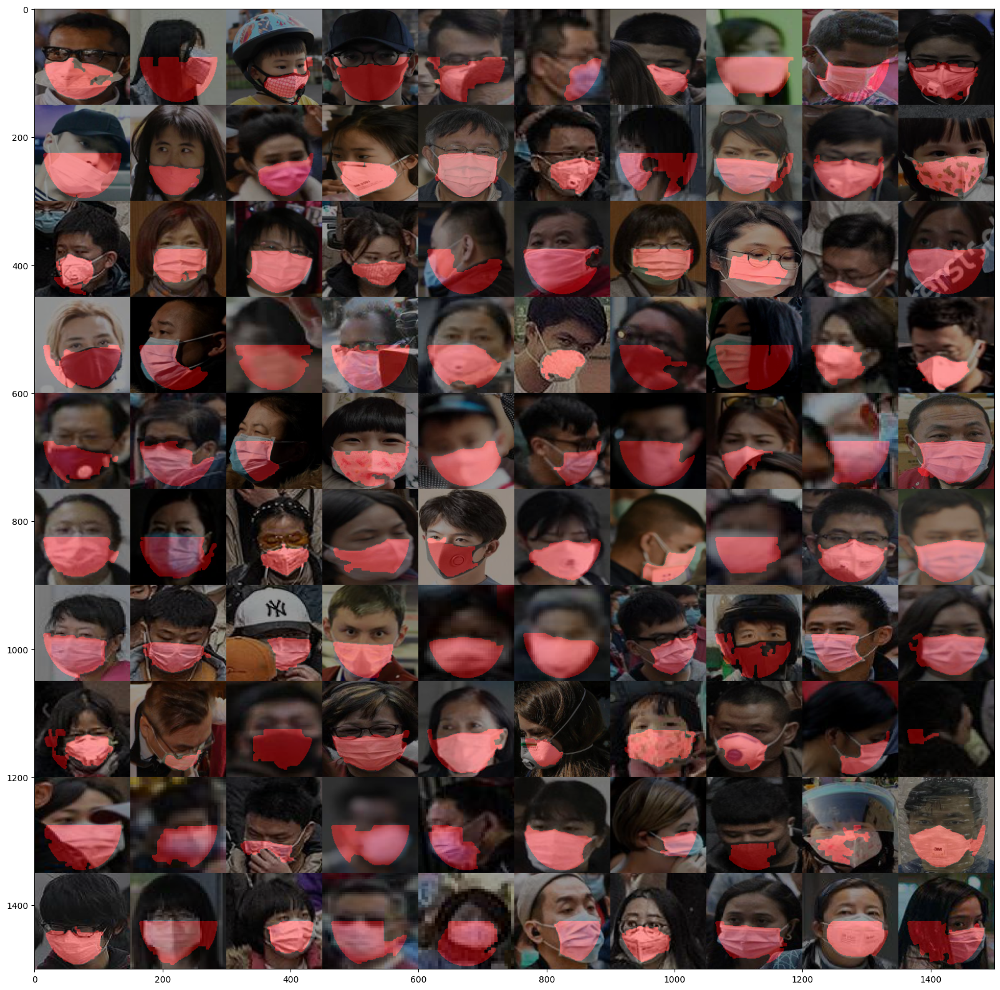

In [83]:
grid_size = [10,10]
seed = 12
plot_grid(patches, (150,150), grid_size, seed)

##**Segmenting face-mask using our Custom CNN (Challenge)**


Now we proceed to the challenge part of the assignment. The task is to include the face-mask segmentation inside the CNN that we defined before so that it performs both tasks. We first need to generate ground truth face-mask segmentations to train our model. For that we use the same method as above as they results were relatively good. 

Run the code below to save the segmentation masks in `.npy` format in the same folders that contain the train, validation and test images. **However I have already done that for you so you dont need to do it necessarily.**

In [ ]:
#Uncomment for generating GT face-mask segmentations. Not necessary to run as it has already been done for you.
"""
from dataloader.dataloader_face import*
from utils.gen_mask_gt import*

light_skin = (0, 50, 0)
dark_skin = (50, 255, 255)
for dir in ["train", "valid", "test"]:
  dataset = Objectdetection('data/'+ dir, class_map, img_size)
  gen_mask_gt(dataset, light_skin, dark_skin)
"""

###**Modify Dataset Class**
We use another dataset class this time. Mask_detection class implements the same methods as before but this time adds additional channel containing the face-mask segmentation. The new ground truth for any image is of the dimension (image.height, image.width, 4) where 4 corresponsds to the one-hot encoded vector representing one of background/no-mask/mask/face-mask classes. Below pic shows the representation.
<center>
<img src=https://drive.google.com/uc?export=view&id=19QoRUX5VnqsaUxz61gETCnDTKZhA_h3v width="500"/>
</center>  



In [12]:
%cd /content/PEA
import os
from dataloader.dataloader_mask import*

class_map = {"back":[1,0,0], "no-mask":[0,1,0], "mask":[0,0,1]}
img_size = (256,256)
batch_size  = 10

# Initialize Train, Validation Datasets  with parameters 
d_train_mask = Mask_Detection('data/train', class_map, img_size)
d_val_mask = Mask_Detection('data/valid', class_map, img_size)

# Load Train, Validation Dataloaders for Training
train_data_mask = Data_Loader_Mask(d_train_mask, batch_size=batch_size, shuffle=True, num_workers=1)
val_data_mask = Data_Loader_Mask(d_val_mask, batch_size=batch_size, shuffle=True, num_workers=1)

/content/PEA


Let us visualize the dataset again. This time the face-masks are also highlighted along with mask and no-mask faces. 

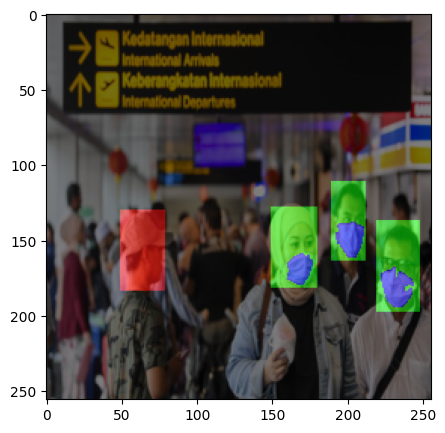

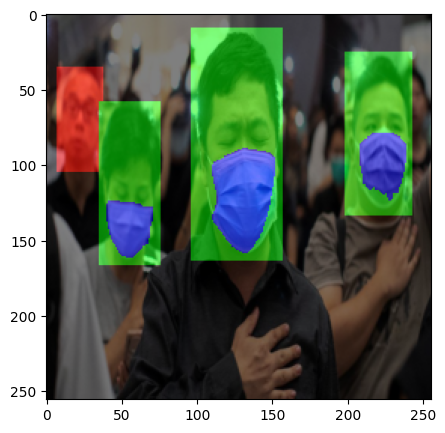

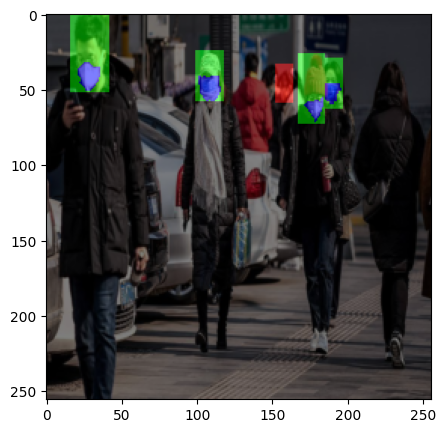

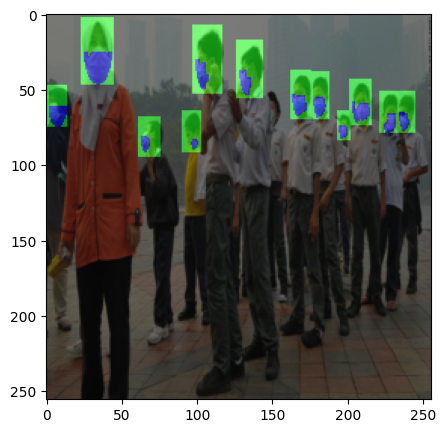

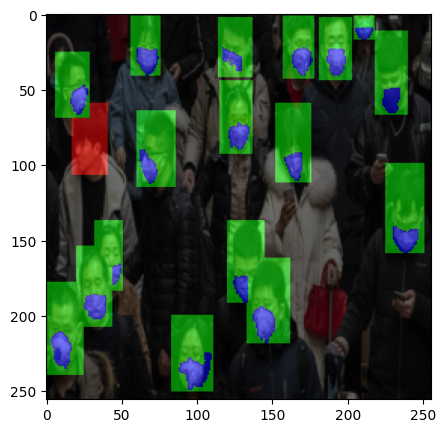

...

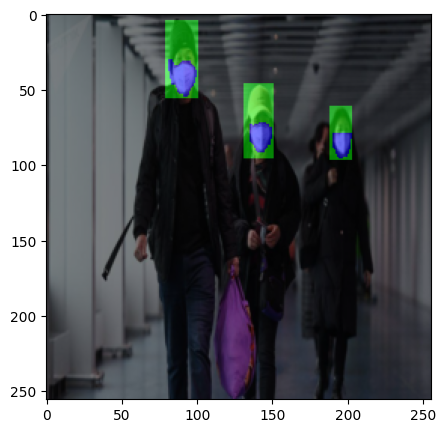

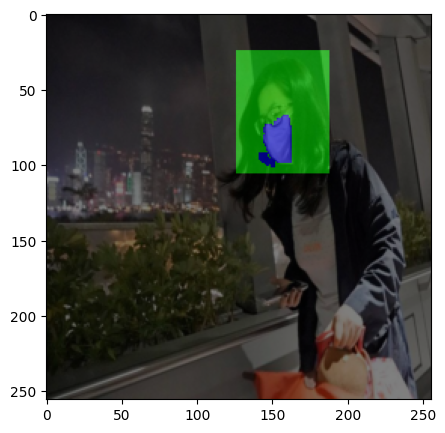

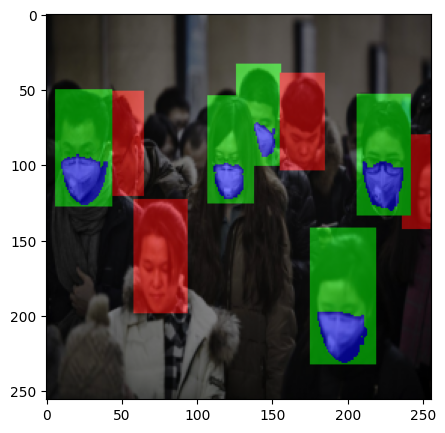

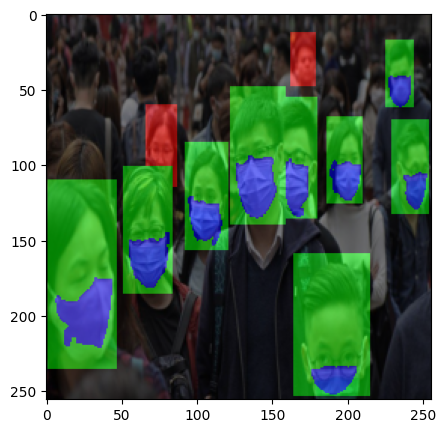

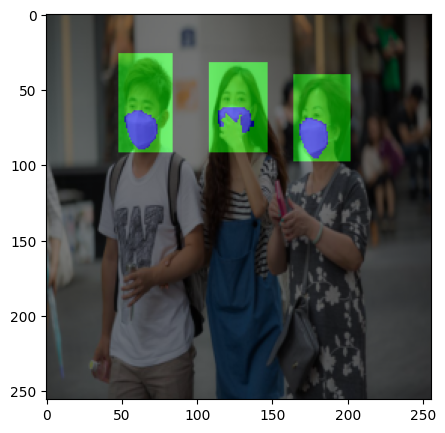

In [2]:
from utils.utils import *
explore_dataset(d_train_mask, 10, show_mask = True)

###**Modify Network**
As we have just added an extra channel to the ground truth, this should be a simple modification. The final CNN layer is modified so that the output channels=4. Rest are retained the same. Refer to `models/CNN_MASK.py` to check the modified class. Run the code below to initialize again.

In [13]:
import torch
from models.CNN_MASK import*

# Create CNN model
model = CNN_MASK()

# Verify compatibility
images, targets = next(iter(train_data_mask))
output = model(images)

print(f'Expected image shape:        (batchsize, 3, 256, 256)')
print(f'Input image shape:           {images.shape}')
print("----------------------------------------------------------")
print(f'Expected ground truth shape: (batchsize, 256, 256, 4)')
print(f'Input ground truth shape:    {targets["masks_faces"].shape}') 
print("----------------------------------------------------------")
print(f'Expected output shape:       (batchsize, 256, 256, 4)')
print(f'Output mask_faces shape:     {output.shape}')

Expected image shape:        (batchsize, 3, 256, 256)
Input image shape:           torch.Size([10, 3, 256, 256])
----------------------------------------------------------
Expected ground truth shape: (batchsize, 256, 256, 4)
Input ground truth shape:    torch.Size([10, 256, 256, 4])
----------------------------------------------------------
Expected output shape:       (batchsize, 256, 256, 4)
Output mask_faces shape:     torch.Size([10, 256, 256, 4])


###**Train**

In [11]:
from train import*

epochs = 100
save_dir = "trained_weights/check_mask.pt"
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

train(model, device, train_data_mask, val_data_mask, epochs, optimizer, focal_loss, save_dir)

Epoch 1/100, Train Loss: 0.1727, Val Loss: 0.2296
Epoch 2/100, Train Loss: 0.1544, Val Loss: 0.2371
Epoch 3/100, Train Loss: 0.1431, Val Loss: 0.1990
Epoch 4/100, Train Loss: 0.1333, Val Loss: 0.1211
Epoch 5/100, Train Loss: 0.1267, Val Loss: 0.1798
Epoch 6/100, Train Loss: 0.1196, Val Loss: 0.1189
Epoch 7/100, Train Loss: 0.1150, Val Loss: 0.1193
Epoch 8/100, Train Loss: 0.1107, Val Loss: 0.1090
Epoch 9/100, Train Loss: 0.1077, Val Loss: 0.1089
Epoch 10/100, Train Loss: 0.1042, Val Loss: 0.1052
Epoch 11/100, Train Loss: 0.1013, Val Loss: 0.1051
Epoch 12/100, Train Loss: 0.0988, Val Loss: 0.1011
Epoch 13/100, Train Loss: 0.0982, Val Loss: 0.1032
Epoch 14/100, Train Loss: 0.0968, Val Loss: 0.1016
Epoch 15/100, Train Loss: 0.0941, Val Loss: 0.0948
Epoch 16/100, Train Loss: 0.0924, Val Loss: 0.1053
Epoch 17/100, Train Loss: 0.0919, Val Loss: 0.1041
Epoch 18/100, Train Loss: 0.0910, Val Loss: 0.0929
Epoch 19/100, Train Loss: 0.0910, Val Loss: 0.0926
Epoch 20/100, Train Loss: 0.0900, Val Lo

##**Test**
Lets run the test script again this time checking for the quality of face-mask segmentation. We can observe that although some of the segmentations are missed, those that were predicted are of good quality. The model has predicted well even in densely populated regions. Try changing the datset to validation to see preditions on more images!.

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


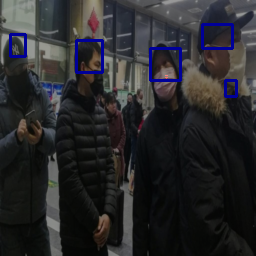

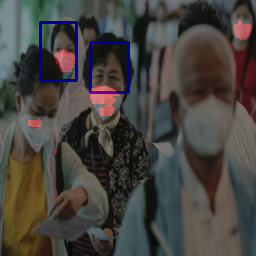

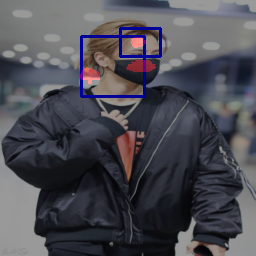

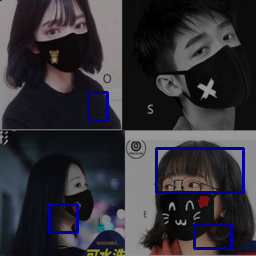

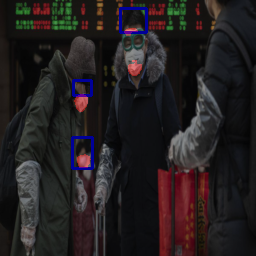

...

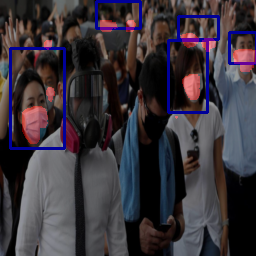

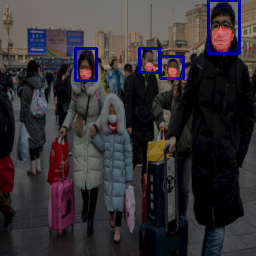

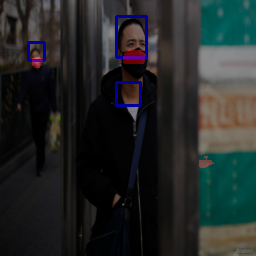

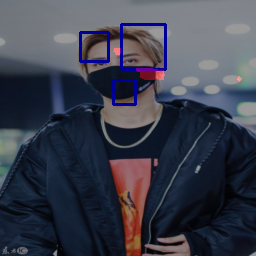

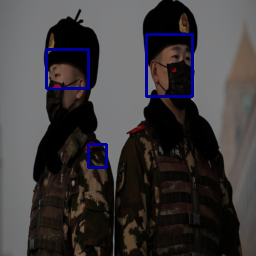

In [14]:
from test_scripts.test_mask import*

thresh = 0.1
d_test_mask = Mask_Detection('data/test', class_map, img_size)
test_data_mask = Data_Loader_Mask(d_test_mask, batch_size=1, shuffle=False, num_workers=1)

model = CNN_MASK()
best_model = "trained_weights/check_mask.pt"
show = {"images": True, "bboxes":True, "face_seg":False, "mask_seg":True}

pred_boxs, true_boxs, p_mask_seg, t_mask_seg = test_mask(model, test_data_mask, best_model, thresh, show, inv_trans=False)

###**Evalutae**
It seeems the bbox accuracy has remained the same. We report an additional metric ie., the Mean IOU score for the face-mask segmentation.

Metrics @ IOU 0.5
-----------------------------
Class Mask
-----------------------------
Precision : 0.567
Recall    : 0.418
F1 Score  : 0.481
AP        : 0.28
-----------------------------
Class No-Mask
-----------------------------
Precision : 0
Recall    : 0
F1 Score  : 0
AP        : 0
-----------------------------
Overall
-----------------------------
Precision : 0.567
Recall    : 0.396
F1 Score  : 0.466
mAP       : 0.142
-----------------------------
-----------------------------
Metric Face-Mask Segmentation 
-----------------------------
Mean IOU : 0.273
-----------------------------


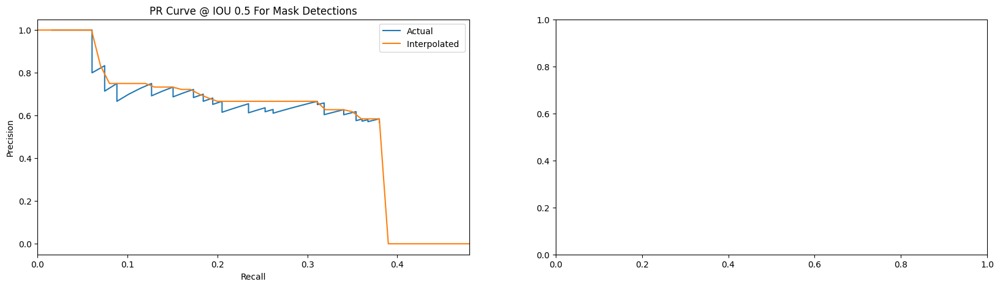

In [15]:
from metrics import*

iou_thresh = 0.5
df_mask, df_nomask, gt_mask_sum, gt_nomask_sum = compute_positives(pred_boxs, true_boxs, iou_thresh)
pr_curve(df_mask, df_nomask, gt_mask_sum, gt_nomask_sum, iou_thresh) 
evaluate_segmentation_accuracy(p_mask_seg, t_mask_seg)

##**Improvements**
As improvements the model following changes were explored.

###**1. Data Augmentation**

The following bit was added to the dataset class as a method of data augumentation. It performs random cropping and horizontal flipping on images with a prob of 0.5.

```
def transform(image, mask, width, height):
    #trans to PIL
    to_pil = transforms.ToPILImage()
    mask = mask.permute(2,0,1)
    mask = to_pil(mask)
    image = to_pil(image)


    # Random crop
    i, j, h, w = transforms.RandomCrop.get_params(
    image, output_size=(height, width))
    image = TF.crop(image, i, j, h, w)
    mask = TF.crop(mask, i, j, h, w)

    # Random horizontal flipping
    if random.random() > 0.5:
       image = TF.hflip(image)
       mask = TF.hflip(mask)

    # Transform to tensor
    image = TF.to_tensor(image)
    mask = TF.to_tensor(mask)
    return image, mask.permute(1,2,0)
```





To enable these transforms, toggle `transforms=True` while calling the dataset class.

In [ ]:
d_train = Face_Detection('data/train', class_map, img_size, transforms=True)
train_data = Data_Loader_Face(d_train_face, batch_size=batch_size, shuffle=True, num_workers=1)

###**2. Data Mining**
To address the class imbalance between no-mask and mask faces, we added patches of no-mask faces sourced from a bank of patches randomly on images during training. These no-mask faces were extracted from the training dataset, scaled randomly, added transforms and pasted on images. Let us visualize this. Although it is not necessary run the code below to extract no-mask face patches and store them in a seperate folder.  

In [5]:
#Has already been run for you. Unnecessary to run.
"""
from utils.extract_nomask_faces import*
folder = "data/nomask_faces/"
extract_nomask_faces(folder, class_map)
"""

To switch on data mining, toggle `data_mine=True` in the dataset class call.

In [5]:
# Initialize Train, Validation Datasets  with parameters 
from dataloader.dataloader_mask import*

d_train_aug = Mask_Detection('data/train', class_map, img_size, transforms=True, data_mine=True)
d_val_aug = Mask_Detection('data/tv', class_map, img_size)

# Load Train, Validation Dataloaders for Training
train_data_aug = Data_Loader_Mask(d_train_aug, batch_size=batch_size, shuffle=True, num_workers=1)
val_data_aug = Data_Loader_Mask(d_val_aug, batch_size=batch_size, shuffle=True, num_workers=1)

When you run the code below, you can see the extra no-mask face patches at random positions and scales paste on the image. The goal is to increase the no-mask instances and retrain the network on this augmented dataset.

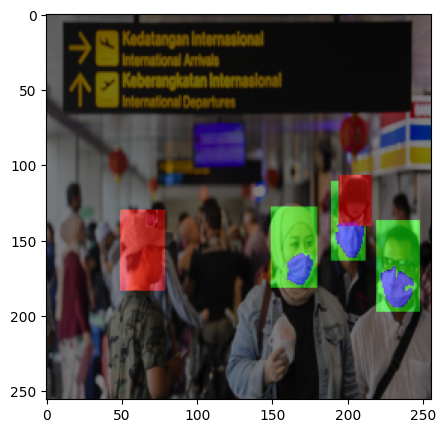

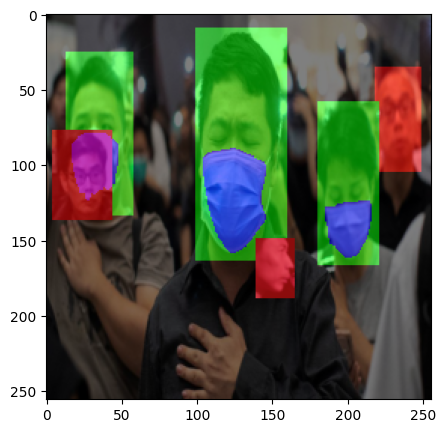

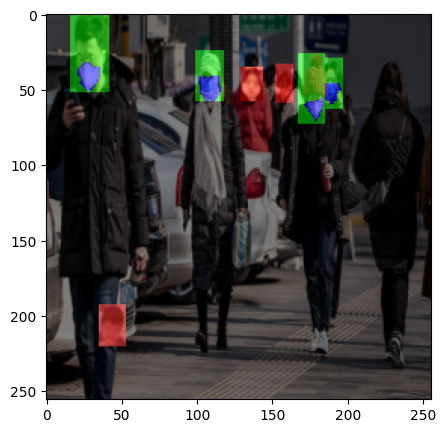

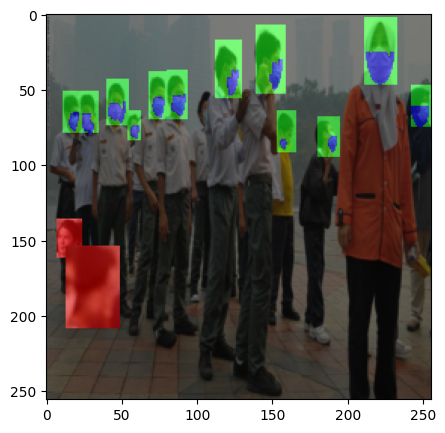

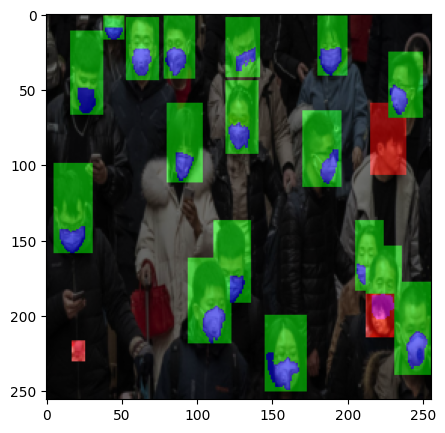

...

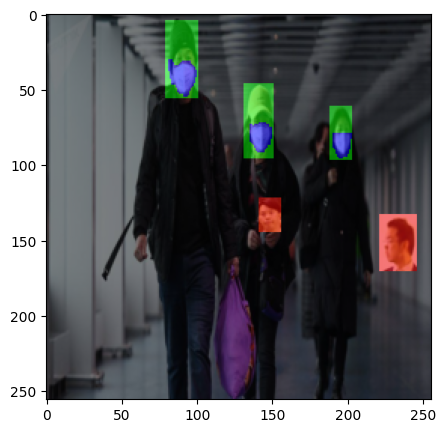

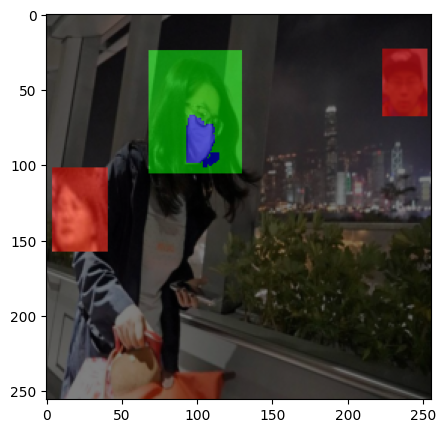

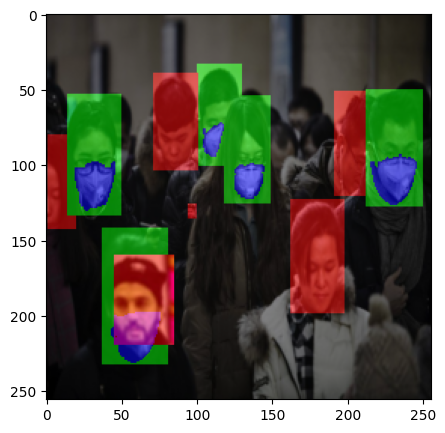

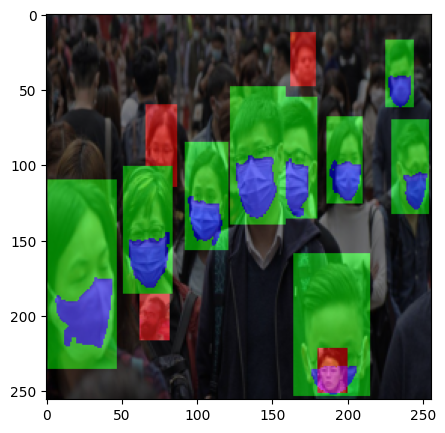

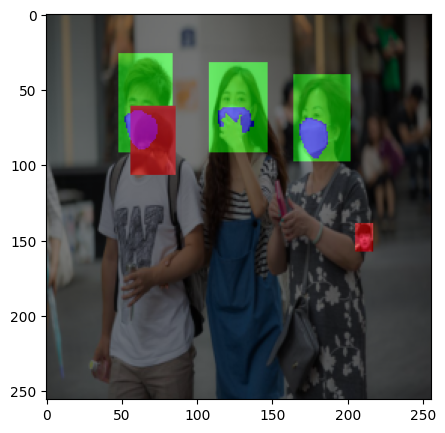

In [3]:
from utils.utils import *
explore_dataset(d_train_aug, 10, show_mask=True)

###**Loss Function**
Standard cross entropy loss and focal loss were tried. Focal loss resulted in better accuracy owing to its adaptive weighting capacity.
###**Network Architecture**
The mentioned architecture was arrived after tinkering with number of CNN layers, dropout, Batchnorm.

###**References**
https://www.jeremyjordan.me/semantic-segmentation/

https://discuss.pytorch.org/t/loss-reduction-sum-vs-mean-when-to-use-each/115641

https://arxiv.org/pdf/1708.02002.pdf

https://towardsdatascience.com/what-is-average-precision-in-object-detection-localization-algorithms-and-how-to-calculate-it-3f330efe697b

https://learnopencv.com/mean-average-precision-map-object-detection-model-evaluation-metric/

## That concludes the project!.

In [16]:
!cp -r /content/PEA /content/drive/MyDrive/

In [12]:
!rm -r data/tv